In [1]:
import warnings
warnings.filterwarnings("ignore")

print("완료!")

완료!


In [2]:
import tensorflow as tf
print(tf.__version__)

2.6.0


# 모델 학습을 위한 데이터셋(dataset) 준비하기

In [3]:
import tensorflow_datasets as tfds

tfds.__version__

'4.4.0'

# tensorflow_datasets에 관한 세부 내용 참조링크
https://www.tensorflow.org/datasets/catalog/overview?hl=ko 

- Structured 데이터 : 행과 열과 같은 명확한 표 형식으로 데이터가 구성된 데이터세트
- 참조할 데이타셋 링크 : https://www.tensorflow.org/datasets/catalog/cats_vs_dogs
- 다운로드 링크 : https://www.microsoft.com/en-us/download/details.aspx?id=54765

In [4]:
!mkdir -p ~/aiffel/cats_vs_dogs/PetImages
!ln -s ~/data/* ~/aiffel/cats_vs_dogs/

ln: failed to create symbolic link '/aiffel/aiffel/cats_vs_dogs/cat_face.jpg': File exists
ln: failed to create symbolic link '/aiffel/aiffel/cats_vs_dogs/cats_vs_dogs': File exists
ln: failed to create symbolic link '/aiffel/aiffel/cats_vs_dogs/my_cat.jpg': File exists
ln: failed to create symbolic link '/aiffel/aiffel/cats_vs_dogs/my_dog.jpg': File exists


In [4]:
(raw_train, raw_validation, raw_test), metadata = tfds.load(  #데이터셋을 로드
    name='cats_vs_dogs',                                      #사용 데이터셋 이름
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],   #데이터셋을 훈련(기차), 검증(검증), 테스트(테스트)로 설정
    data_dir='~/aiffel/cats_vs_dogs/',                        #데이터셋을 저장하거나 참조할 위치
    download=False,                                          #추가 다운로드를 방지
    with_info=True,                                          #데이터셋의 데이터(설명,좌우 등)
    as_supervised=True,                                      #(image, label) 형식으로 데이터를 반환
)

In [5]:
print(raw_train)
print(raw_validation)
print(raw_test)

<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>


* (image, label) -> ((None, None, 3), ()) : image의 shape/label의 shape
* image : (height, width, channel), 정해져 있지 않은 사이즈이기 때문에 None으로 표시
* 채널의 수 : 3 (RGB)
* 흑백 이미지는 white/black만 나타내면 되므로 단 하나의 채널만 있어도 충분
* abel은 특정 이미지가 강아지인지, 혹은 고양이인지를 나타내는 단일 값, 단순히 1차원의 숫자 하나로 표현될 수 있기 때문에 차원이 따로 나타나지 않았습니다

# 데이터 시각화를 통해 확인하고, 모델에 입력할 수 있는 형태로 전처리하기

In [6]:
import tensorflow as tf
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

print("슝~")

슝~


* raw_train 안에 있는 데이터를 확인, tf.data.Dataset에서 제공하는 take라는 함수를 사용
 - 기능 : 인수로 받은 개수만큼의 데이터를 추출하여 새로운 데이터셋 인스턴스를 생성하여 리턴하는 함수

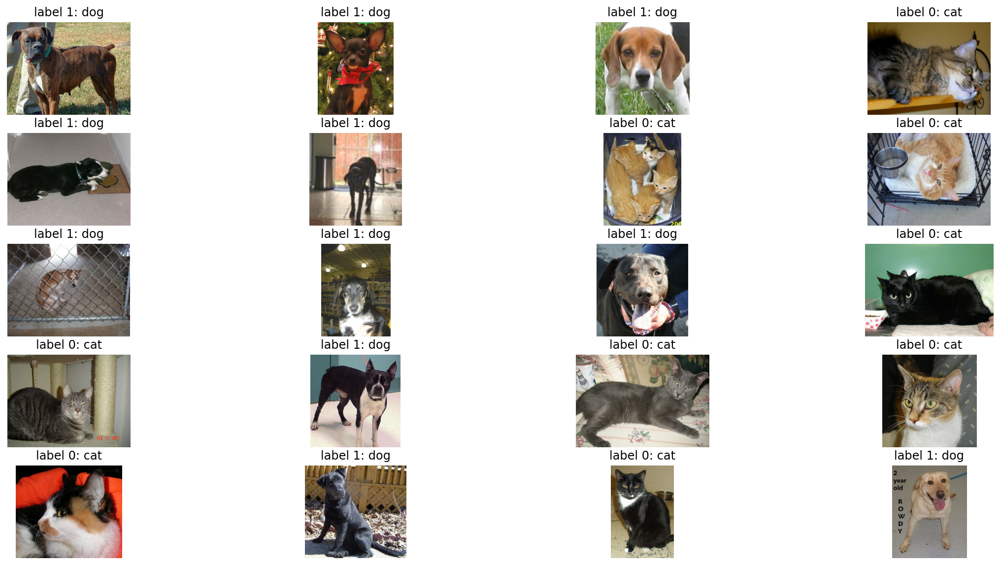

In [7]:
#plt.figure(figsize=(10, 5))
plt.figure(figsize=(20, 10))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(20)):  # 10개의 데이터를 가져 옵니다.
    plt.subplot(5, 4, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

* 강아지: label 1, 고양이: label 0 설정
* 이미지를 같은 포맷으로 통일 : format_example()

* 타입캐스팅(Type Casting) : 형변환이라고도 불리는 타입개스팅은 다른 데이터 타입으로 형(타입)을 바꿔주는 것을 의미, float()

In [9]:
# 아래 코드는 이미지의 사이즈를 160x160 픽셀로 통일시킬 뿐만 아니라, 
# 각 픽셀값의 scale을 수정해주는 역할도 합니다.

IMG_SIZE = 160 # 리사이징할 이미지의 크기

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전. 입력된 이미지를 tf.float32유형으로 변환
    image = (image/127.5) - 1 # 픽셀값의 scale 수정, 이미지는 보통 0에서 255사이의 가치로 표현, 이 배열은 배열 값을 [-1, 1]범위로 스케일링
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE)) #이미지를 IMG_SIZE x IMG_SIZE크기로 변환
    return image, label   #처리된 이미지와 해당하는 label 반환
 
print("슝~")

슝~


* image = (image / 127.5) - 1
 - 이미지는 보통 0에서 255사이의 가치로 표현됩니다.
 - 이 배열은 배열 값을 [-1, 1]범위로 스케일링합니다:
    * 0 → -1
    * 127.5 → 0
    * 255 → 1
 - 신경망의 서서히 학습을 위해 가치의 범위를 조정하는 과정입니다.
    * 0~255 사이의 값들을 그 중간값인 127.5로 나누고 1을 뺐으므로, -1 ~ 1 사이의 실수값이 된다.


# -- 아래는 map함수 실습

In [10]:
a = [1.2, 2.5, 3.7, 4.6] 
a = list(map(int, a))# 리스트의 요소를 정수로 변환 하여 리스트로 생성
a

[1, 2, 3, 4]

In [11]:
b = [0,1,2,3,4,5,6,7,8,9] 
b = list(map(str, b))# 리스트의 요소를 정수로 변환 하여 리스트로 생성
b

['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']

# -- 여기까지 map 함수 실습 끝!

In [12]:
#데이타셋 이미지의 크기를 (160, 160, 3)으로 통일
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

print(train)
print(validation)
print(test)

<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>


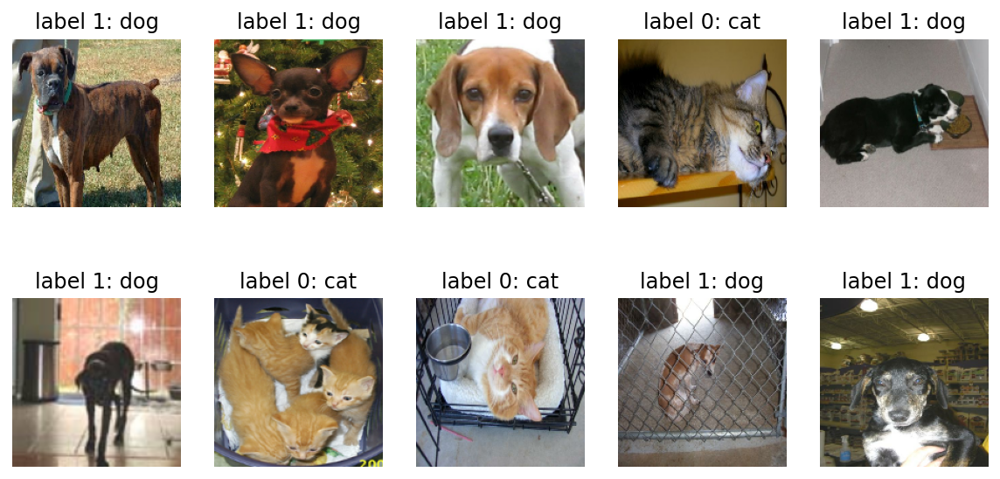

In [13]:
# matplotlib으로 이미지를 시각화 할 경우에는 모든 픽셀값이 양수여야 하므로, 
# -1 ~ 1 사이의 픽셀값을 1을 더한 후 2로 나눠서 0~1 사이의 값으로 변환하였다 ( => image = (image + 1) / 2 )

plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

# 텐서플로우를 활용해 모델 구조 설계하기

In [14]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

print("슝~")

슝~


In [15]:
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=2, activation='softmax')
])

model.summary()  #모델의 전체 구조표시

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 160, 160, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 80, 80, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 80, 80, 32)        4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 40, 40, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 40, 40, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 20, 20, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 25600)             0

* shape: (None, height, width, channel) 
* 첫 번째 차원은 데이터의 개수 : None
* feature map
* CNN(Convolutional Neural Net)

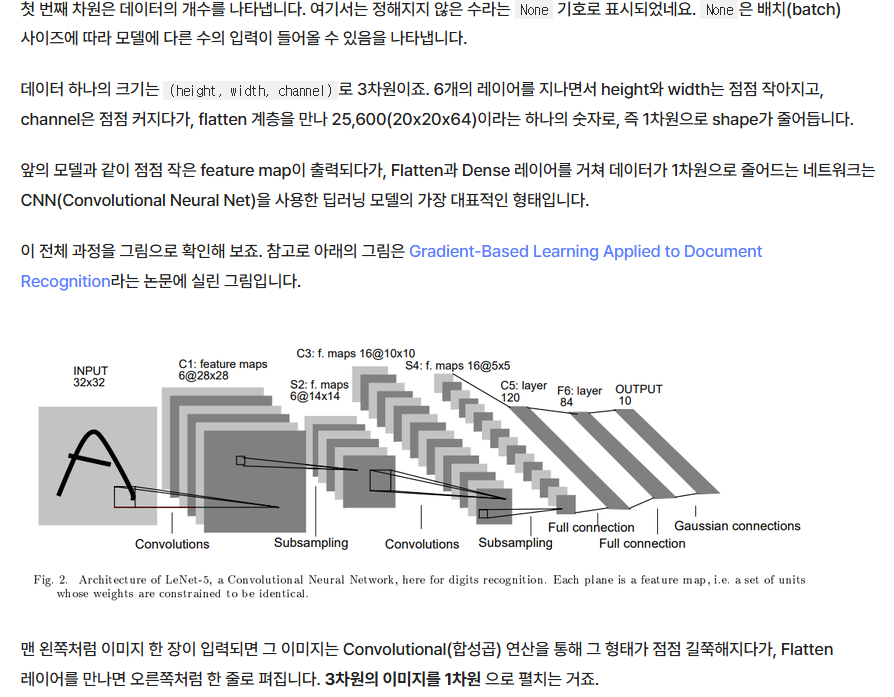

In [16]:
# -- numpy 

import numpy as np

image = np.array([[1, 2], [3, 4]])
print(image.shape)
image

(2, 2)


array([[1, 2],
       [3, 4]])

In [17]:
image.flatten()

array([1, 2, 3, 4])

* 모델에서 flatten 레이어를 통과한다는 것도 위와 같이 모든 숫자를 일렬로 펼쳐놓는 것 과 같습니다.
* 결과 : 
   - 딥러닝 모델은 (160, 160, 3) 크기의 3차원 이미지를 입력받아 여러 레이어를 거치며 형태를 바꾸다가 
     최종적으로는 몇 개의 숫자를 출력해내는 함수라고 할 수 있습니다.

# 모델 compile 완료 후 학습시키기

 * learning_rate : 학습률, 0.0001로 설정
 * 모델을 compile 하여 학습할 수 있는 형태로 변환
 
 * optimizer : 학습을 어떤 방식으로 시킬것인지 결정, 어떻게 최적화시킬 것인지를 결정하기 때문에 최적화 함수라고도 한다
 * loss : 모델이 학습해나가야 하는 방향을 결정
           * - ex) 입력 이미지가 고양이(label=0)일 경우 모델의 출력이 [1.0, 0.0]
           * -                   강아지(label=1)일 경우 [0.0, 1.0] 방향 제시
 * metrics : 모델의 성능을 평가하는 척도
             성능을 평가할 수 있는 지표는 정확도(accuracy), 정밀도(precision), 재현율(recall)등이 있음.

In [18]:
learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

#print("슝~")

In [19]:
# 모델을 학습시킬 데이터를 준비

BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000
#print("슝~")

In [20]:
# BATCH_SIZE에 따라 32개의 데이터를 랜덤으로 뿌려줄 3개의 배치를 생성

train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)  #모델이 끊임없이 학습될 수 있도록 전체 데이터에서 32개를 랜덤뽑기 
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

#print("슝~")

In [21]:
for image_batch, label_batch in train_batches.take(1):
    break

#image_batch의 shape는 [32, 160, 160, 3], label_batch의 shape는 [32]
image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

# 초기 모델의 성능 확인

In [23]:
validation_steps = 20
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))  #얼마나 모델이 틀렸는지(손실), 낮을수록 좋은 것
print("initial accuracy: {:.2f}".format(accuracy0))

11/20 [===============>..............] - ETA: 0s - loss: 0.6959 - accuracy: 0.4659

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9


20/20 [==============================] - 1s 31ms/step - loss: 0.6955 - accuracy: 0.4781
initial loss: 0.70
initial accuracy: 0.48


Corrupt JPEG data: 252 extraneous bytes before marker 0xd9


# 모델학습

In [24]:
EPOCHS = 10
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
170/582 [=======>......................] - ETA: 16s - loss: 0.6662 - accuracy: 0.6037

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 15s - loss: 0.6581 - accuracy: 0.6139

212/582 [=========>....................] - ETA: 15s - loss: 0.6565 - accuracy: 0.6148

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


283/582 [=============>................] - ETA: 12s - loss: 0.6413 - accuracy: 0.6302

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.6075 - accuracy: 0.6630

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.6060 - accuracy: 0.6648

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


517/582 [=========================>....] - ETA: 2s - loss: 0.6036 - accuracy: 0.6662

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.5995 - accuracy: 0.6705

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.5987 - accuracy: 0.6713

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.5954 - accuracy: 0.6744

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 28s 44ms/step - loss: 0.5954 - accuracy: 0.6744 - val_loss: 0.5421 - val_accuracy: 0.7244
Epoch 2/10
169/582 [=======>......................] - ETA: 17s - loss: 0.5143 - accuracy: 0.7487

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


203/582 [=========>....................] - ETA: 15s - loss: 0.5136 - accuracy: 0.7483

213/582 [=========>....................] - ETA: 15s - loss: 0.5145 - accuracy: 0.7482

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


285/582 [=============>................] - ETA: 12s - loss: 0.5074 - accuracy: 0.7525

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.4927 - accuracy: 0.7617

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.4920 - accuracy: 0.7620

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


517/582 [=========================>....] - ETA: 2s - loss: 0.4907 - accuracy: 0.7630

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.4888 - accuracy: 0.7637

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.4877 - accuracy: 0.7646

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.4866 - accuracy: 0.7647

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 27s 44ms/step - loss: 0.4865 - accuracy: 0.7648 - val_loss: 0.4835 - val_accuracy: 0.7691
Epoch 3/10
169/582 [=======>......................] - ETA: 18s - loss: 0.4440 - accuracy: 0.7957

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


201/582 [=========>....................] - ETA: 17s - loss: 0.4385 - accuracy: 0.8001

213/582 [=========>....................] - ETA: 16s - loss: 0.4375 - accuracy: 0.7999

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


284/582 [=============>................] - ETA: 13s - loss: 0.4350 - accuracy: 0.8000

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.4230 - accuracy: 0.8083

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.4232 - accuracy: 0.8074

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


517/582 [=========================>....] - ETA: 2s - loss: 0.4220 - accuracy: 0.8082

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.4209 - accuracy: 0.8087

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.4217 - accuracy: 0.8081

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.4197 - accuracy: 0.8088

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 27s 45ms/step - loss: 0.4198 - accuracy: 0.8089 - val_loss: 0.4578 - val_accuracy: 0.7872
Epoch 4/10
169/582 [=======>......................] - ETA: 17s - loss: 0.3933 - accuracy: 0.8277

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


203/582 [=========>....................] - ETA: 15s - loss: 0.3896 - accuracy: 0.8288

213/582 [=========>....................] - ETA: 15s - loss: 0.3887 - accuracy: 0.8297

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


285/582 [=============>................] - ETA: 12s - loss: 0.3805 - accuracy: 0.8338

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


492/582 [========================>.....] - ETA: 3s - loss: 0.3696 - accuracy: 0.8378

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


506/582 [=========================>....] - ETA: 3s - loss: 0.3698 - accuracy: 0.8381

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


516/582 [=========================>....] - ETA: 2s - loss: 0.3690 - accuracy: 0.8384

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


544/582 [===========================>..] - ETA: 1s - loss: 0.3679 - accuracy: 0.8385

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


550/582 [===========================>..] - ETA: 1s - loss: 0.3672 - accuracy: 0.8390

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


580/582 [============================>.] - ETA: 0s - loss: 0.3659 - accuracy: 0.8397

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 27s 44ms/step - loss: 0.3658 - accuracy: 0.8398 - val_loss: 0.5015 - val_accuracy: 0.7670
Epoch 5/10
170/582 [=======>......................] - ETA: 17s - loss: 0.3362 - accuracy: 0.8579

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 16s - loss: 0.3395 - accuracy: 0.8561

212/582 [=========>....................] - ETA: 15s - loss: 0.3381 - accuracy: 0.8566

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


284/582 [=============>................] - ETA: 12s - loss: 0.3310 - accuracy: 0.8608

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


492/582 [========================>.....] - ETA: 3s - loss: 0.3213 - accuracy: 0.8657

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


506/582 [=========================>....] - ETA: 3s - loss: 0.3209 - accuracy: 0.8660

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


516/582 [=========================>....] - ETA: 2s - loss: 0.3198 - accuracy: 0.8664

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


544/582 [===========================>..] - ETA: 1s - loss: 0.3179 - accuracy: 0.8675

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


550/582 [===========================>..] - ETA: 1s - loss: 0.3169 - accuracy: 0.8680

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


580/582 [============================>.] - ETA: 0s - loss: 0.3165 - accuracy: 0.8676

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 27s 44ms/step - loss: 0.3166 - accuracy: 0.8673 - val_loss: 0.4934 - val_accuracy: 0.7747
Epoch 6/10
170/582 [=======>......................] - ETA: 17s - loss: 0.2887 - accuracy: 0.8814

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 16s - loss: 0.2889 - accuracy: 0.8798

212/582 [=========>....................] - ETA: 15s - loss: 0.2866 - accuracy: 0.8812

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


283/582 [=============>................] - ETA: 12s - loss: 0.2820 - accuracy: 0.8838

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.2726 - accuracy: 0.8889

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.2716 - accuracy: 0.8894

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


515/582 [=========================>....] - ETA: 2s - loss: 0.2712 - accuracy: 0.8895

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.2691 - accuracy: 0.8901

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.2685 - accuracy: 0.8904

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.2678 - accuracy: 0.8898

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 28s 46ms/step - loss: 0.2679 - accuracy: 0.8898 - val_loss: 0.4536 - val_accuracy: 0.8005
Epoch 7/10
169/582 [=======>......................] - ETA: 17s - loss: 0.2485 - accuracy: 0.9020

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


203/582 [=========>....................] - ETA: 15s - loss: 0.2468 - accuracy: 0.9022

213/582 [=========>....................] - ETA: 15s - loss: 0.2449 - accuracy: 0.9026

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


283/582 [=============>................] - ETA: 12s - loss: 0.2388 - accuracy: 0.9054

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.2271 - accuracy: 0.9114

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.2267 - accuracy: 0.9116

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


515/582 [=========================>....] - ETA: 2s - loss: 0.2259 - accuracy: 0.9124

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.2233 - accuracy: 0.9136

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.2229 - accuracy: 0.9135

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.2211 - accuracy: 0.9140

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 27s 45ms/step - loss: 0.2210 - accuracy: 0.9141 - val_loss: 0.4858 - val_accuracy: 0.8014
Epoch 8/10
170/582 [=======>......................] - ETA: 17s - loss: 0.2009 - accuracy: 0.9210

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 15s - loss: 0.1976 - accuracy: 0.9220

212/582 [=========>....................] - ETA: 15s - loss: 0.1974 - accuracy: 0.9222

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


285/582 [=============>................] - ETA: 12s - loss: 0.1934 - accuracy: 0.9249

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.1834 - accuracy: 0.9288

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.1821 - accuracy: 0.9295

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


515/582 [=========================>....] - ETA: 2s - loss: 0.1815 - accuracy: 0.9299

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.1799 - accuracy: 0.9306

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.1795 - accuracy: 0.9307

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.1782 - accuracy: 0.9311

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 27s 44ms/step - loss: 0.1781 - accuracy: 0.9312 - val_loss: 0.5077 - val_accuracy: 0.8014
Epoch 9/10
170/582 [=======>......................] - ETA: 16s - loss: 0.1532 - accuracy: 0.9476

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 15s - loss: 0.1519 - accuracy: 0.9479

212/582 [=========>....................] - ETA: 15s - loss: 0.1509 - accuracy: 0.9486

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


284/582 [=============>................] - ETA: 12s - loss: 0.1462 - accuracy: 0.9505

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.1392 - accuracy: 0.9525

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.1385 - accuracy: 0.9527

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


517/582 [=========================>....] - ETA: 2s - loss: 0.1376 - accuracy: 0.9530

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.1373 - accuracy: 0.9530

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.1368 - accuracy: 0.9532

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.1359 - accuracy: 0.9539

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 27s 44ms/step - loss: 0.1359 - accuracy: 0.9539 - val_loss: 0.5688 - val_accuracy: 0.8014
Epoch 10/10
170/582 [=======>......................] - ETA: 17s - loss: 0.1211 - accuracy: 0.9579

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 15s - loss: 0.1193 - accuracy: 0.9595

212/582 [=========>....................] - ETA: 15s - loss: 0.1192 - accuracy: 0.9590

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


284/582 [=============>................] - ETA: 12s - loss: 0.1146 - accuracy: 0.9618

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.1061 - accuracy: 0.9649

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.1054 - accuracy: 0.9652

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


517/582 [=========================>....] - ETA: 2s - loss: 0.1053 - accuracy: 0.9651

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.1029 - accuracy: 0.9664

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.1040 - accuracy: 0.9659

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.1025 - accuracy: 0.9666

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 27s 44ms/step - loss: 0.1025 - accuracy: 0.9666 - val_loss: 0.7598 - val_accuracy: 0.7605


# 모델 학습곡선 확인 및 예측 결과 시각화하기

* accuracy는 훈련 데이터셋에 대한 정확도, val_accuracy는 검증 데이터셋에 대한 정확도

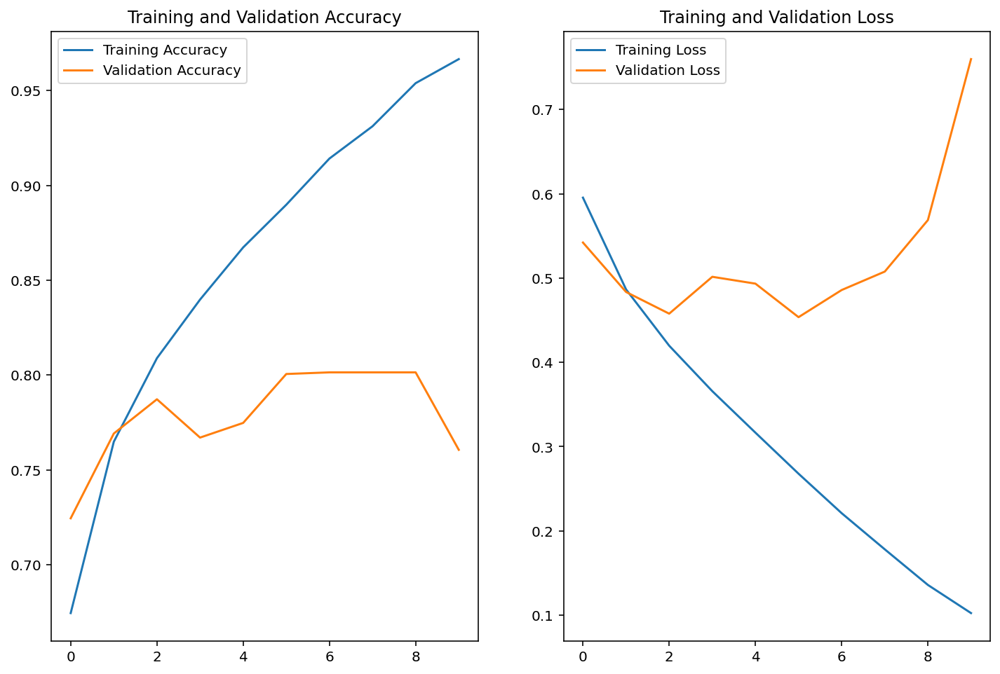

In [25]:
acc = history.history['accuracy']  #학습정확도
val_acc = history.history['val_accuracy']  #검증정확도

loss=history.history['loss']  #학습손실율
val_loss=history.history['val_loss']  #검증손실율

epochs_range = range(EPOCHS)  #EPOCHS = 10

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)  #1행2열중 1열의 그림
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')  #학습/검증 정확도

plt.subplot(1, 2, 2) #1행2열중 2열의 그림
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')  #학습/건증의 손실율
plt.show()

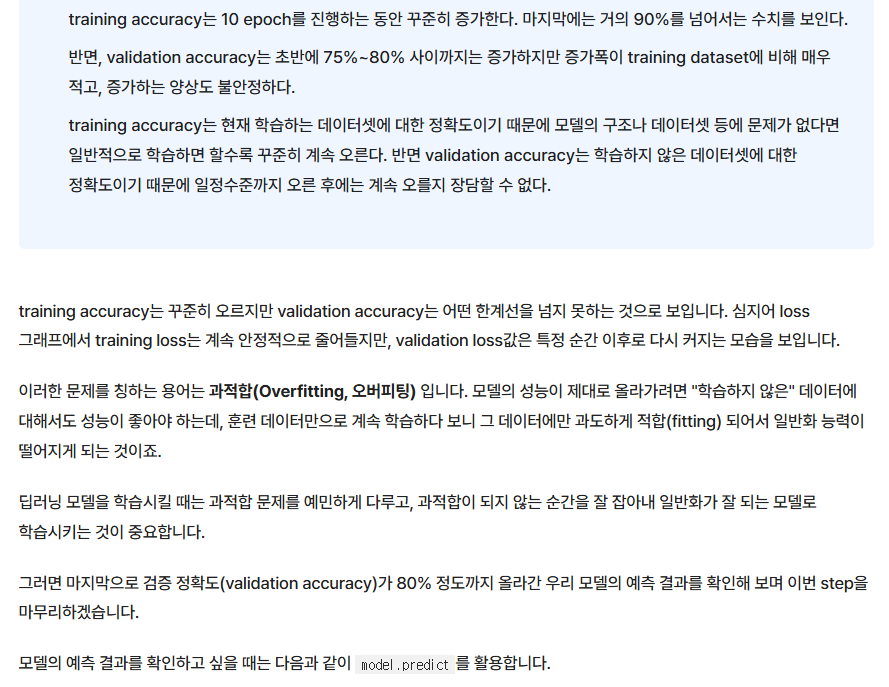

In [26]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    break

predictions

array([[9.9948478e-01, 5.1519281e-04],
       [6.1871165e-01, 3.8128835e-01],
       [7.6082550e-02, 9.2391747e-01],
       [9.9983037e-01, 1.6962396e-04],
       [3.8258035e-02, 9.6174198e-01],
       [2.4616269e-02, 9.7538370e-01],
       [4.6255726e-02, 9.5374423e-01],
       [6.2486631e-01, 3.7513363e-01],
       [4.1544124e-02, 9.5845586e-01],
       [1.7194588e-02, 9.8280543e-01],
       [2.6611513e-01, 7.3388487e-01],
       [9.9455833e-01, 5.4416801e-03],
       [9.7631800e-01, 2.3682075e-02],
       [2.7576785e-03, 9.9724233e-01],
       [9.8566914e-01, 1.4330887e-02],
       [9.3156743e-01, 6.8432637e-02],
       [5.2296691e-02, 9.4770330e-01],
       [1.5885068e-06, 9.9999845e-01],
       [5.5083990e-01, 4.4916010e-01],
       [8.8283676e-01, 1.1716321e-01],
       [3.1947133e-01, 6.8052870e-01],
       [1.5109810e-01, 8.4890187e-01],
       [9.9796283e-01, 2.0372190e-03],
       [8.3917642e-01, 1.6082358e-01],
       [8.7705535e-01, 1.2294470e-01],
       [9.7258776e-02, 9.

* predictions : [고양이일 확률, 강아지의 확률] 
* [1.0, 0.0] :  label이 0인 고양이 ,  [0.0, 1.0] : label이 1인 강아지

# prediction 값들을 실제 추론한 라벨(고양이:0, 강아지:1)로 변환

In [27]:
predictions = np.argmax(predictions, axis=1)
predictions

array([0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1,
       0, 0, 0, 1, 0, 1, 1, 0, 0, 0])

# prediction 시각화

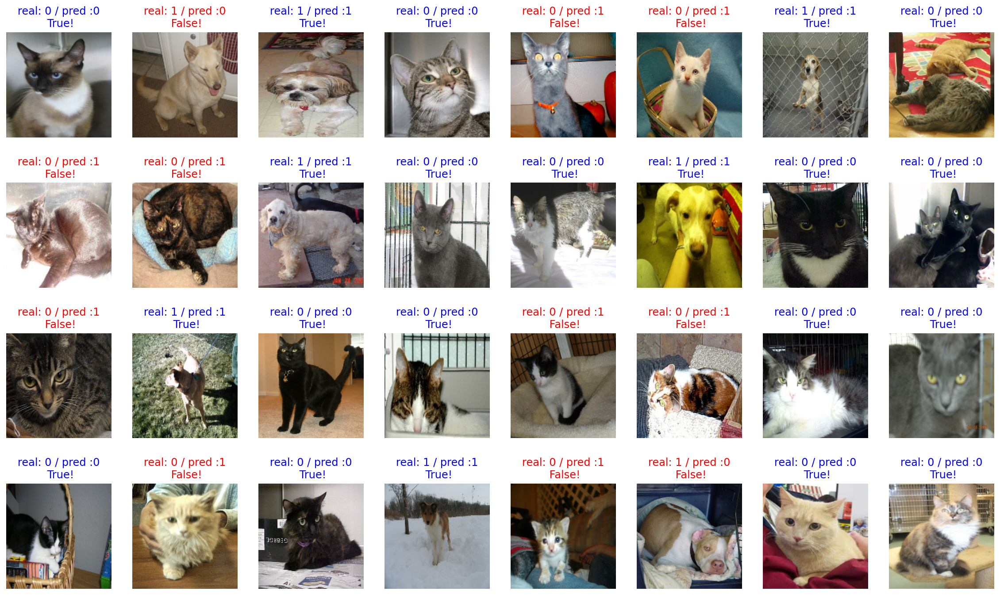

In [28]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [29]:
# 예측(prediction)의 정확도(accuracy) 갯수 구하기
    
count = 0   # 정답을 맞춘 개수

for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count= count + 1

print(count / 32 * 100)

65.625


# ====  이미지 분류 대회인 ILSVRC와 데이터셋 ImageNet ====

* ILSVRC(ImageNet Large Scale Visual Recognition Challenge)  : 컴퓨터 비전 분야의 올림픽대회

# Transfer Learning(전이학습)

* 거인의 어깨에 서서 문제를 푼다 (standing on the soulder of giants)
 - 사전학습 된 모델 (pre-trained model) 을 이용하는 것을 뜻

* 이미지 분류 문제의 목적 : 특정 이미지들을 주어진 카테고리로 정확하게 분류하는 것

* 사전학습 된 모델이란, 
  내가 풀고자 하는 문제와 비슷하면서 사이즈가 큰 데이터로 이미 학습이 되어 있는 모델입니다. 
  그런 큰 데이터로 모델을 학습시키는 것은 오랜 시간과 연산량이 필요하므로, 
  관례적으로는 이미 공개되어있는 모델들을 그저 import해서 사용합니다
 
* 일반적인 CNN 모델의 두 파트 
  - Convolutional base : 이미지로부터 특징을 효과적으로 추출하는 것 (feature extraction), 합성곱층과 풀링층이 여러겹 쌓여있는 부분
  - Classifier : 추출된 특징을 잘 학습해서 이미지를 알맞은 카테고리로 분류하는 것 (image classification) 
  
* 모델의 첫 번째 층은 "일반적인(general)" 특징을 추출, 재사용
* 모델의 마지막 층에 가까워질수록 특정 데이터셋 또는 특정 문제에서만 나타날 수 있는 구체적인(specific) 특징을 추출, 새로 학습이 필요

* Convolutional base :
  - 낮은 레벨의 계층(input에 가까운 계층)일수록 일반적인 특징을 추출
  - 높은 레벨의 계층(output에 가까운 계층)과 Classifier 부분은 보다 구체적이고 특유한 특징들을 추출

* 사전에 학습된 모델을 내 프로젝트에 맞게 재정의하기
  - 원래 모델에 있던 classifier를 없애는 것으로 시작
  - 내 목적에 맞는 새로운 classifier를 추가
  - 그 후 마지막으로는 새롭게 만들어진 나의 모델을 다음 세 가지 전략 중 한 가지 방법을 이용해 파인튜닝(fine-tune)을 진행
     * 전체 모델을 새로 학습시키기
     * Convolutional base의 일부분은 고정시킨 상태로, 나머지 계층과 classifier를 새로 학습시키기
     * Convloutional base는 고정시키고, classifier만 새로 학습시키기
     

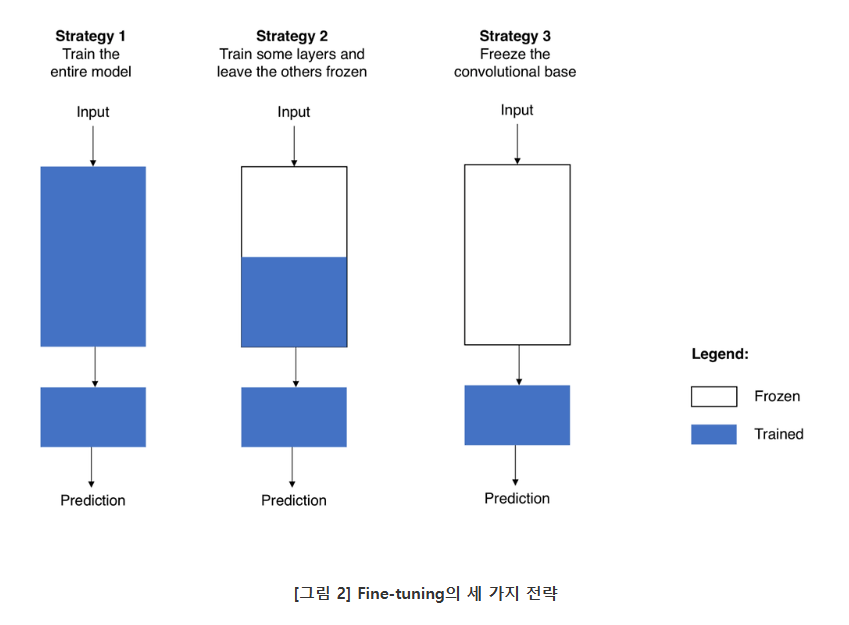

# 사전 학습 모델인 VGG16을 가져오고, 모델의 구조 확인하기

In [30]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)  #IMG_SIZE = 160 # 리사이징할 이미지의 크기 (160,160,3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

58900480/58889256 [==============================] - 0s 0us/step


In [31]:
# 원래 사이즈를 확인(image_batch), 32는 이미지의 장수

image_batch.shape

TensorShape([32, 160, 160, 3])

In [32]:
# 이 벡터는 이미지에서 특징을 추출해 낸 "특징 벡터"라고 부르기도 합니다

feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 512])

In [33]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 160, 160, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 160, 160, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 160, 160, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 80, 80, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 80, 80, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 80, 80, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 40, 40, 128)       0     

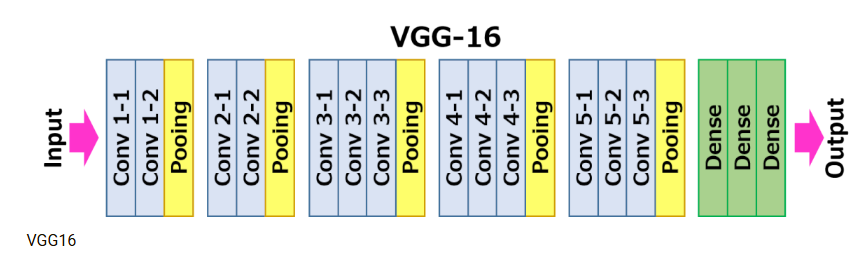

# VGG16 끝단에 classifier 레이어를 붙여서 원하는 구조의 분류 모델 만들기

In [34]:
feature_batch.shape

TensorShape([32, 5, 5, 512])

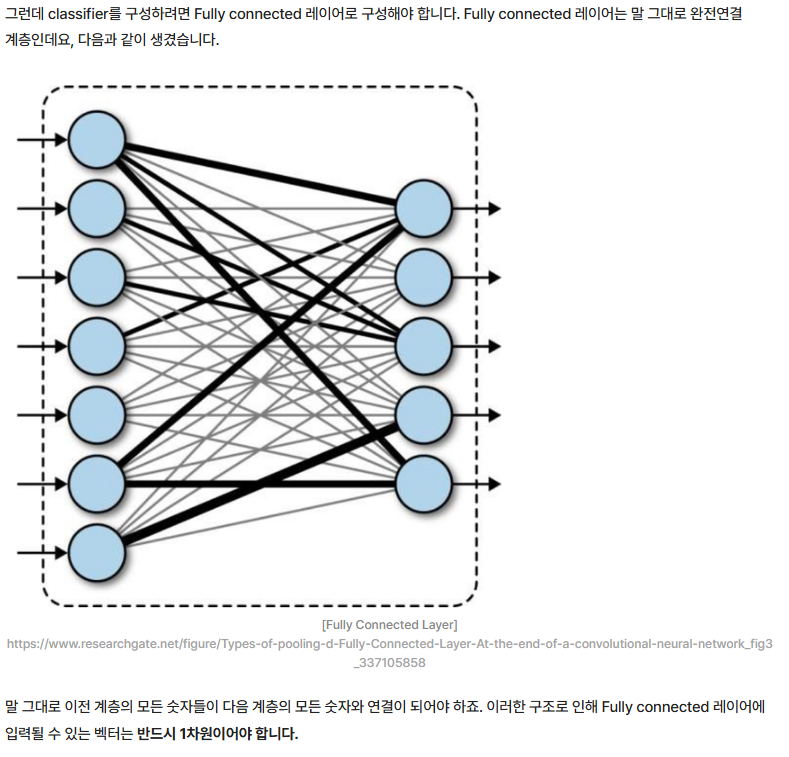

# --- Flatten 레이어 실습 ---

In [35]:
import numpy as np

image = np.array([[1, 2],
                  [3, 4]])

flattened_image = image.flatten()

print("Original image:\n", image)
print("Original image shape:", image.shape)
print()
print("Flattened image:\n", flattened_image)
print("Flattened image shape:", flattened_image.shape)

Original image:
 [[1 2]
 [3 4]]
Original image shape: (2, 2)

Flattened image:
 [1 2 3 4]
Flattened image shape: (4,)


* Flattening 하는 것보다 조금 더 좋은 방법 -> Global Average Pooling

* 높은 차원을 다루려면 그 차원을 다룰 수 있는 많은수의 파라미터들을 필요로 합니다.
  - 하지만 파라미터가 너무 많아지면 학습 시 over fitting이 발생할 수 있는 문제가 발생하곤 합니다. 
  - 따라서 필터에 사용된 파라미터 수를 줄여서 차원을 감소시킬 방법이 필요합니다
  - 이런 역할을 CNN에서 해 주는 레이어가 pooling layer
  
* Global Average Pooling   (GAP)
  - Max(Average) Pooling 보다 더 급격하게 feature의 수를 줄입니다
  - 평균 값을 취하는 방법
  - feature의 모든 값들을 이용하면서 (평균) 하면서 feature의 크기를 줄여 차원을 감소시킵니다
  - GAP의 목적은 feature를 1차원 벡터로 만들기 위함입니다
  - GAP는 CNN + FC(Fully Connected) Layer에서 classifier인 FC Layer를 없애기 위한 방법으로 도입
  - GAP는 어떤 크기의 feature 라도 같은 채널의 값들을 하나의 평균 값으로 대체하기 때문에 벡터가 됩니다
  - 어떤 사이즈의 입력이 들어와도 상관이 없습니다
  -  (H, W, C) → (1, 1, C) 크기로 줄어드는 연산이므로, 파라미터가 추가되지 않으므로 학습 측면에서도 유리

In [36]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
print("슝~")

슝~


In [37]:
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 512)


In [38]:
# dense layer에는 unit과 activation 2개의 매개변수만 사용해주세요.
# unit의 값은 위에서 global_average_layer를 통과했을 때의 값을 생각해보세요.
# 활성화 함수는 ReLU를 사용합니다.
dense_layer = Dense(512, activation='relu')
# unit은 우리가 분류하고 싶은 class를 생각해보세요.
# 활성화 함수는 Softmax를 사용합니다.
prediction_layer = Dense(2, activation='softmax')

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))  
print(prediction_batch.shape)

(32, 2)


* 우리의 데이터들은 처음에 이미지에서 특징을 추출해 줄 VGG16, base_model에 입력되어 특징이 추출된 다음, 
* 그 특징 벡터는 global_average_layer를 거쳐 마지막에 prediction_layer까지 통과하며 강아지인지, 고양이인지 예측이 될 것입니다.

In [39]:
base_model.trainable = False
print("슝~")

슝~


In [40]:
model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])

print("슝~")

슝~


In [41]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 5, 5, 512)         14714688  
_________________________________________________________________
global_average_pooling2d (Gl (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 512)               262656    
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 1026      
Total params: 14,978,370
Trainable params: 263,682
Non-trainable params: 14,714,688
_________________________________________________________________


# VGG16을 기반 이미지 분류기 학습시키고, 직접 만들었던 모델과 결과 비교해 보기

In [42]:
base_learning_rate = 0.0001

model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [43]:
validation_steps=20
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

 6/20 [========>.....................] - ETA: 0s - loss: 0.7039 - accuracy: 0.4740

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9


18/20 [==========================>...] - ETA: 0s - loss: 0.7088 - accuracy: 0.4931

Corrupt JPEG data: 252 extraneous bytes before marker 0xd9


20/20 [==============================] - 5s 61ms/step - loss: 0.7070 - accuracy: 0.4969
initial loss: 0.71
initial accuracy: 0.50


In [44]:
EPOCHS = 5

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/5
167/582 [=======>......................] - ETA: 32s - loss: 0.3782 - accuracy: 0.8707

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 29s - loss: 0.3574 - accuracy: 0.8770

210/582 [=========>....................] - ETA: 29s - loss: 0.3514 - accuracy: 0.8786

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 23s - loss: 0.3190 - accuracy: 0.8890

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 7s - loss: 0.2663 - accuracy: 0.9040

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 6s - loss: 0.2640 - accuracy: 0.9043

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 5s - loss: 0.2625 - accuracy: 0.9045

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 3s - loss: 0.2578 - accuracy: 0.9064

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.2568 - accuracy: 0.9068

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.2517 - accuracy: 0.9081

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 57s 94ms/step - loss: 0.2517 - accuracy: 0.9081 - val_loss: 0.1711 - val_accuracy: 0.9299
Epoch 2/5
167/582 [=======>......................] - ETA: 33s - loss: 0.1662 - accuracy: 0.9311

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 30s - loss: 0.1638 - accuracy: 0.9334

210/582 [=========>....................] - ETA: 29s - loss: 0.1627 - accuracy: 0.9342

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 23s - loss: 0.1653 - accuracy: 0.9335

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 7s - loss: 0.1624 - accuracy: 0.9343

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 6s - loss: 0.1618 - accuracy: 0.9344

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 5s - loss: 0.1613 - accuracy: 0.9348

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 3s - loss: 0.1597 - accuracy: 0.9352

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.1600 - accuracy: 0.9354

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1597 - accuracy: 0.9356

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 52s 87ms/step - loss: 0.1597 - accuracy: 0.9356 - val_loss: 0.1692 - val_accuracy: 0.9308
Epoch 3/5
167/582 [=======>......................] - ETA: 33s - loss: 0.1455 - accuracy: 0.9405

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 30s - loss: 0.1470 - accuracy: 0.9406

210/582 [=========>....................] - ETA: 30s - loss: 0.1478 - accuracy: 0.9405

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 24s - loss: 0.1485 - accuracy: 0.9397

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 7s - loss: 0.1485 - accuracy: 0.9393

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 6s - loss: 0.1480 - accuracy: 0.9394

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 5s - loss: 0.1470 - accuracy: 0.9400

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 3s - loss: 0.1467 - accuracy: 0.9405

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.1462 - accuracy: 0.9409

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1462 - accuracy: 0.9412

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 53s 88ms/step - loss: 0.1462 - accuracy: 0.9412 - val_loss: 0.1509 - val_accuracy: 0.9329
Epoch 4/5
167/582 [=======>......................] - ETA: 34s - loss: 0.1347 - accuracy: 0.9426

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 31s - loss: 0.1354 - accuracy: 0.9425

210/582 [=========>....................] - ETA: 30s - loss: 0.1362 - accuracy: 0.9429

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 24s - loss: 0.1389 - accuracy: 0.9415

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 7s - loss: 0.1407 - accuracy: 0.9409

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 6s - loss: 0.1405 - accuracy: 0.9410

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 5s - loss: 0.1391 - accuracy: 0.9417

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 3s - loss: 0.1392 - accuracy: 0.9418

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.1397 - accuracy: 0.9417

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1389 - accuracy: 0.9419

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 53s 89ms/step - loss: 0.1389 - accuracy: 0.9419 - val_loss: 0.1448 - val_accuracy: 0.9415
Epoch 5/5
167/582 [=======>......................] - ETA: 33s - loss: 0.1313 - accuracy: 0.9474

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 31s - loss: 0.1343 - accuracy: 0.9464

210/582 [=========>....................] - ETA: 30s - loss: 0.1329 - accuracy: 0.9470

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 24s - loss: 0.1351 - accuracy: 0.9455

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 7s - loss: 0.1363 - accuracy: 0.9443

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 6s - loss: 0.1366 - accuracy: 0.9439

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 5s - loss: 0.1355 - accuracy: 0.9444

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 3s - loss: 0.1351 - accuracy: 0.9443

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.1349 - accuracy: 0.9445

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1344 - accuracy: 0.9450

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 53s 90ms/step - loss: 0.1344 - accuracy: 0.9450 - val_loss: 0.1412 - val_accuracy: 0.9377


# 모델 학습 및 검증의 정확도 및  손실율 결과 시각화

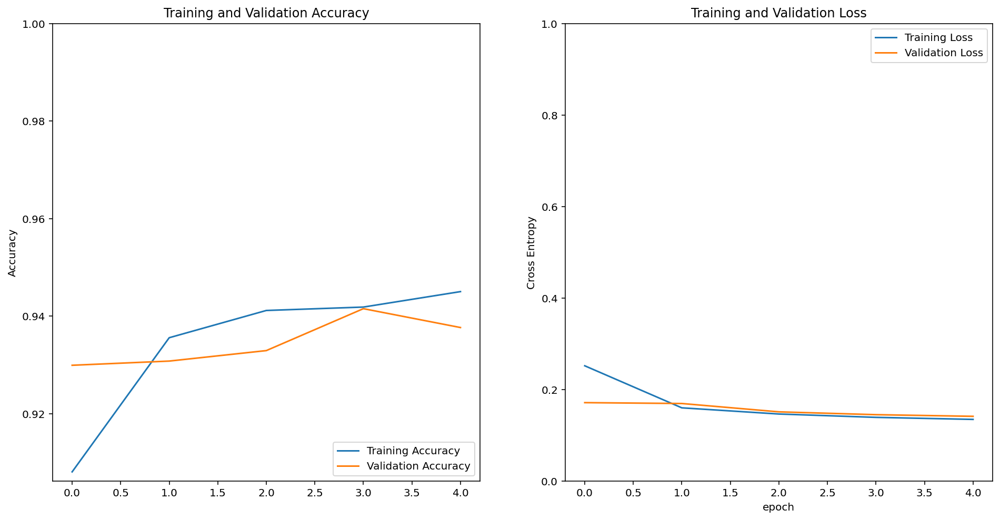

In [46]:
acc = history.history['accuracy']  #정확도(학습)
val_acc = history.history['val_accuracy']  #정확도(검증)

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)   # 학습/검증의 정확도비교
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)  #학습/검증의 손실율비교
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [47]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[9.9998963e-01, 1.0408778e-05],
       [1.5952428e-01, 8.4047568e-01],
       [4.0949216e-01, 5.9050786e-01],
       [9.9999642e-01, 3.6055233e-06],
       [9.9798501e-01, 2.0150363e-03],
       [9.9192071e-01, 8.0792531e-03],
       [1.6316447e-04, 9.9983680e-01],
       [7.5059897e-01, 2.4940099e-01],
       [9.7360623e-01, 2.6393741e-02],
       [9.8129565e-01, 1.8704331e-02],
       [7.3653755e-05, 9.9992633e-01],
       [9.9996340e-01, 3.6622707e-05],
       [9.9162418e-01, 8.3758309e-03],
       [6.2974050e-06, 9.9999368e-01],
       [9.9876475e-01, 1.2353125e-03],
       [9.9114764e-01, 8.8522853e-03],
       [9.9743015e-01, 2.5698144e-03],
       [4.8951242e-02, 9.5104879e-01],
       [6.8306077e-01, 3.1693920e-01],
       [9.9631160e-01, 3.6884276e-03],
       [9.3964601e-01, 6.0354032e-02],
       [9.8545641e-01, 1.4543573e-02],
       [9.9510032e-01, 4.8996969e-03],
       [9.8195159e-01, 1.8048482e-02],
       [9.9883741e-01, 1.1625582e-03],
       [9.8786128e-01, 1.

In [48]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 1, 0, 0])

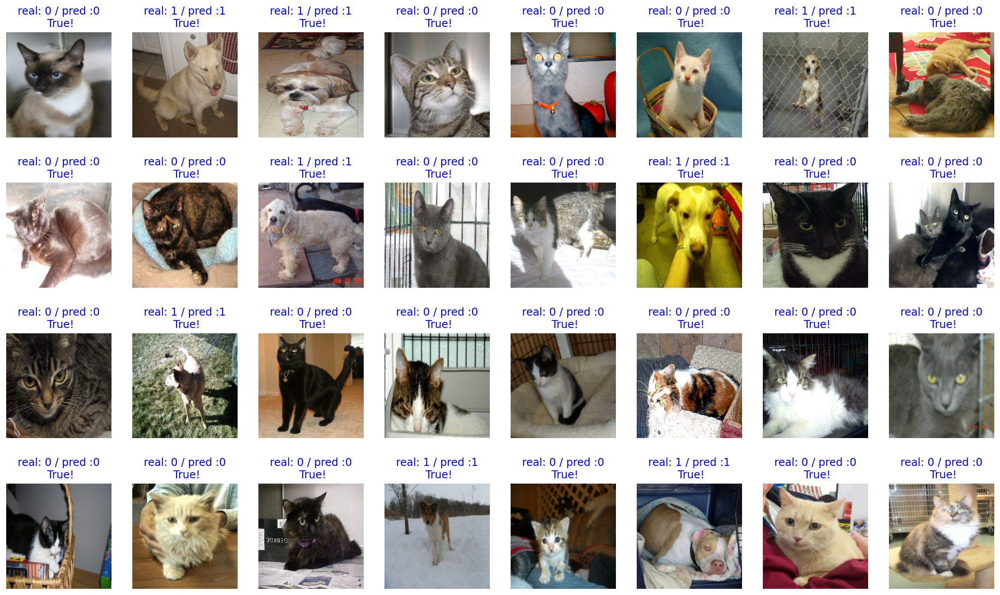

In [49]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [50]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100) # 약 95% 내외

100.0


# 모델을 save 하고, 다시 load 해와서 사용하는 방법 익히기

In [51]:
!mkdir -p ~/aiffel/cat_vs_dog/checkpoint
!mkdir -p ~/aiffel/cat_vs_dog/images

In [52]:
import os

checkpoint_dir = os.getenv("HOME") + "/aiffel/cat_vs_dog/checkpoint"
checkpoint_file_path = os.path.join(checkpoint_dir, 'checkpoint')

if not os.path.exists('checkpoint_dir'):
    os.mkdir('checkpoint_dir')
    
model.save_weights(checkpoint_file_path)     # checkpoint 파일 생성

if os.path.exists(checkpoint_file_path):
  print('checkpoint 파일 생성 OK!!')

checkpoint 파일 생성 OK!!


# 학습된 모델에 원하는 이미지를 입력해 예측 결과 확인해 보기

* https://www.freepik.com/

In [53]:
!ln -s ~/data/* ~/aiffel/cat_vs_dog/images/

# tensorflow 모델에 입력해주기 위해 load_img, img_to_array 함수를 가져오기

In [54]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array

* 아래부분의 IMG_SIZE = 160 ~ 모델예측(prediction) 끝까지 부분을 show_and_predict_image 함수에서 기능구현한것임

/aiffel/aiffel/cat_vs_dog/images
/aiffel/aiffel/cat_vs_dog/images/my_dog.jpg


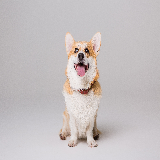

In [60]:
IMG_SIZE = 160
img_dir_path = os.getenv("HOME") + "/aiffel/cat_vs_dog/images"
print(img_dir_path)
dog_image_path = os.path.join(img_dir_path, 'my_dog.jpg')
print(dog_image_path)

dog_image = load_img(dog_image_path, target_size=(IMG_SIZE, IMG_SIZE))
dog_image

In [56]:
# 모델에 넣을 수 있도록 이미지를 array, 즉 배열 자료형으로 변환

dog_image = img_to_array(dog_image).reshape(1, IMG_SIZE, IMG_SIZE, 3)
dog_image.shape

(1, 160, 160, 3)

In [59]:
# 모델예측
prediction = model.predict(dog_image)
prediction

array([[1.7163472e-17, 1.0000000e+00]], dtype=float32)

In [61]:
def show_and_predict_image(dirpath, filename, img_size=160):
    filepath = os.path.join(dirpath, filename)
    print(f"filepath: {filepath}")
    
    image = load_img(filepath, target_size=(img_size, img_size)) #target_size 크기로 이미지로딩
    plt.imshow(image)
    plt.axis('off')
    
    image = img_to_array(image).reshape(1, img_size, img_size, 3)  #모델에 넣을 수 있도록 이미지를 array, 즉 배열 자료형으로 변환
    prediction = model.predict(image)[0]  #모델예측
    
    cat_percentage = round(prediction[0] * 100)
    dog_percentage = round(prediction[1] * 100)
    
    print(f"This image seems {dog_percentage}% dog, and {cat_percentage}% cat.")

filepath: /aiffel/aiffel/cat_vs_dog/images/my_dog.jpg
This image seems 100% dog, and 0% cat.


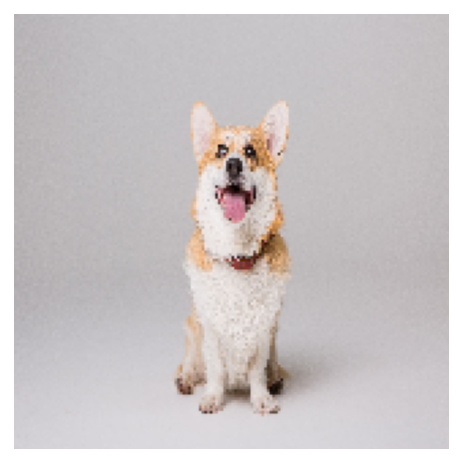

In [62]:
#filename만 바꾸어 원하는대로 실험가능

filename = 'my_dog.jpg'

show_and_predict_image(img_dir_path, filename)  #img_dir_path=/aiffel/aiffel/cat_vs_dog/images, filename=my_dog.jpg

filepath: /aiffel/aiffel/cat_vs_dog/images/my_cat.jpg
This image seems 0% dog, and 100% cat.


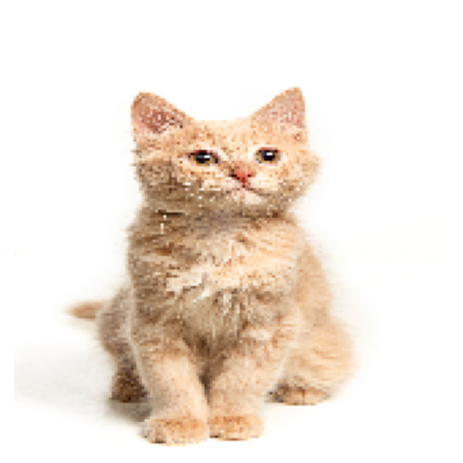

In [63]:
filename = 'my_cat.jpg'

show_and_predict_image(img_dir_path, filename)

filepath: /aiffel/aiffel/cat_vs_dog/images/cat_face.jpg
This image seems 0% dog, and 100% cat.


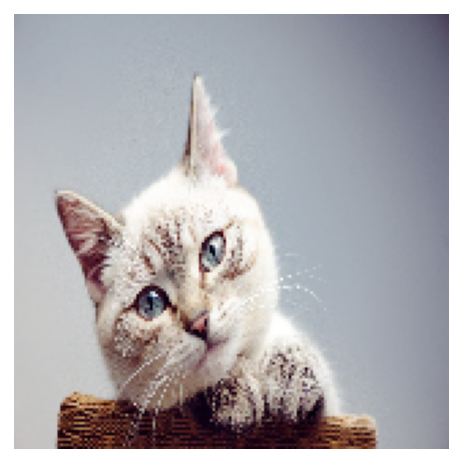

In [64]:
filename = "cat_face.jpg"
show_and_predict_image(img_dir_path, filename)

filepath: /aiffel/aiffel/cat_vs_dog/images/1.jpg
This image seems 100% dog, and 0% cat.


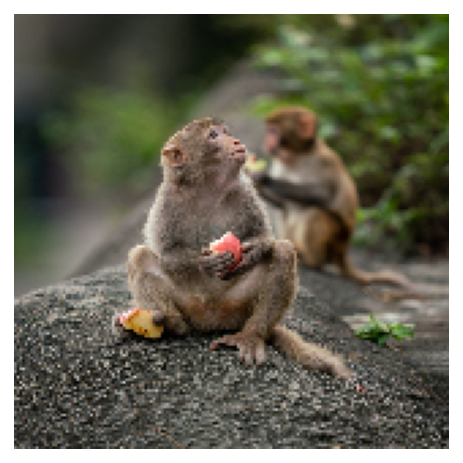

In [73]:
filename = "1.jpg"
show_and_predict_image(img_dir_path, filename)

filepath: /aiffel/aiffel/cat_vs_dog/images/2.jpg
This image seems 100% dog, and 0% cat.


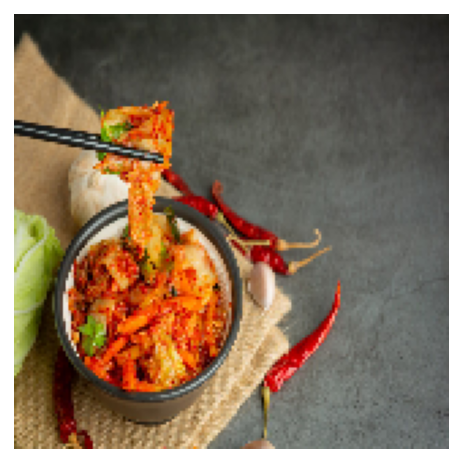

In [74]:
filename = "2.jpg"
show_and_predict_image(img_dir_path, filename)

filepath: /aiffel/aiffel/cat_vs_dog/images/3.jpg
This image seems 100% dog, and 0% cat.


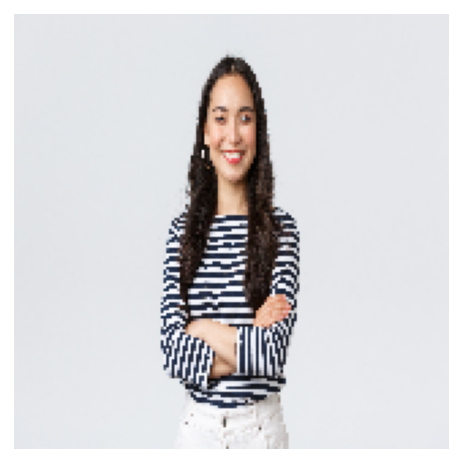

In [75]:
filename = "3.jpg"
show_and_predict_image(img_dir_path, filename)